# Sentiment Analysis of Boston's Airbnb Reviews

Team 11 members : **Jinke Han, Yifan Fan, Xiang Liu, Qianyi Mo**.    

Date: **03/03/2024**

# Summary

In our project, we embarked on a comprehensive examination of Airbnb reviews and listings in Boston to understand guest experiences and preferences. Our data preparation phase involved cleaning and preprocessing two datasets to ensure quality and relevance for analysis. During the exploratory data analysis (EDA), we observed trends such as a decrease in reviews during 2020 due to the pandemic, a preference for entire homes/apartments, and generally high guest satisfaction. We further conducted topic analysis using the gensim library to uncover prevalent themes in the reviews and evaluated our model for coherence and perplexity, optimizing it based on the findings. This study aims to provide insights into the sentiment and preferences of Airbnb users in Boston, guiding improvements in service and offerings.

# Table of Contents

1. Introduction

  1.1 Problem Statement & Motivation

  1.2 Business Value

  1.3 Dataset Description

2. Data Explore

  2.1 Data Preprocessing

  2.2 EDA

3. Text Mining

  3.1 Detect Non-English Words

  3.2 Using Regex to clean text

  3.3 Tokenization

  3.4 Word2Vec

  3.5 Word Cloud

4. T-SNE

5. Sentiment Analysis

6. Topic Analysis using LDA

7. Model Evaluation

8. Alpha and Eta in LDA

9. LDA Visualization

  9.1 Word Cloud

  9.2 Intertopic Distance Map

10. Conclusions

11. Challenges

12. References

# 1. Introduction


##1.1 Problem Statement & Motivation

In the dynamic market of Airbnb, understanding guest sentiment and the factors influencing their experiences is crucial for both hosts and guests. The recent shifts in travel trends and accommodation preferences underscore the importance of this understanding. Our project is geared towards utilizing Natural Language Processing (NLP) to analyze guest reviews, identifying key factors that contribute to their satisfaction or dissatisfaction. The goal is to provide actionable insights that hosts can use to enhance their services and assist guests in making informed decisions, ultimately enhancing the quality of Airbnb stays in Boston.


## 1.2 Business value

Our project offers multi-faceted benefits to Boston's Airbnb ecosystem. By analyzing guest feedback across neighborhoods, we provide Airbnb with detailed insights for better user matching, enhancing customer satisfaction, and competitive edge. Hosts gain valuable feedback to improve listings and adjust amenities, potentially increasing occupancy rates. For guests, the project enables more informed accommodation choices, aligning with their expectations and needs. Overall, this initiative serves as a strategic tool for all stakeholders in the Airbnb market.

## 1.3 Dateset Description

Our dataset provides insights into past customers' experiences and offers detailed reviews about their stays, including details such as the reviewer's name, specific comments, and more. This dataset allows us to better understand each customer's perspective on the apartment and is perfect for those who want to fully understand what makes the Airbnb experience so special. The project datasets were sourced from Inside Airbnb, accessible here: http://insideairbnb.com/get-the-data. We have three datasets: listings with 4,204 rows and 75 columns, calendars with 1,534,396 rows and 7 columns, and reviews with 182,482 rows and 6 columns. We will merge them and select the data from March 21, 2009, to December 18, 2023.

# 2. Data Explore

## 2.1 Data preprocessing

Firstly, import the necessary library and dataset.

In [84]:
import pandas as pd
from datetime import datetime
import seaborn as sns
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='urllib3')

Keep the columns that we need and drop the columns that are meaningless.

In [85]:
df_reviews = pd.read_csv('https://raw.githubusercontent.com/jinke7678/BA820_Project_Team11/main/data/reviews.csv')
df_reviews.drop(['id','reviewer_name'], axis=1, inplace=True)
df_reviews.rename(columns={'date': 'review_date'}, inplace=True)
df_reviews

,listing_id,review_date,reviewer_id,comments
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...
4,3781,2015-10-30,15151513,Great value for the money! This location has e...
...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...


In [86]:
df_list=pd.read_csv('https://raw.githubusercontent.com/jinke7678/BA820_Project_Team11/main/data/listings.csv')

In [87]:
columns_to_keep= [
    'id','neighbourhood_cleansed','price', 'latitude', 'longitude',
    'room_type', 'number_of_reviews','review_scores_rating']
df_list1= df_list[columns_to_keep]
df_list1 = df_list1.drop_duplicates()
df_list1.rename(columns={'id': 'listing_id'}, inplace=True)
df_list1

,listing_id,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,5506,Roxbury,$135.00,42.328440,-71.095810,Entire home/apt,122,4.79
2,6695,Roxbury,$179.00,42.328020,-71.093870,Entire home/apt,127,4.81
3,8789,Beacon Hill,$91.00,42.358670,-71.063070,Entire home/apt,27,4.67
4,10813,Back Bay,$86.00,42.350610,-71.087870,Entire home/apt,5,5.00
...,...,...,...,...,...,...,...,...
4199,1046563598019556549,Dorchester,$83.00,42.285236,-71.069907,Entire home/apt,1,5.00
4200,1046568292864752336,Downtown,$107.00,42.352970,-71.063690,Entire home/apt,0,NaN
4201,1047166785349446101,Fenway,$136.00,42.347480,-71.090780,Entire home/apt,0,NaN
4202,1047226383263246733,Dorchester,$83.00,42.285161,-71.067922,Entire home/apt,0,NaN


Merge our two datasets using left join.

In [88]:
df = pd.merge(df_reviews, df_list1, on='listing_id', how='left')
df

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
4,3781,2015-10-30,15151513,Great value for the money! This location has e...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,$110.00,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,$140.00,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50


Dropping null values and using the average price of each room type to fill the missing values.

In [89]:
df.isna().sum()

listing_id                   0
review_date                  0
reviewer_id                  0
comments                    57
neighbourhood_cleansed       0
price                     7901
latitude                     0
longitude                    0
room_type                    0
number_of_reviews            0
review_scores_rating         0
dtype: int64

In [90]:
data = df.dropna(subset=['comments'])
data

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
0,3781,2015-07-10,36059247,The apartment was as advertised and Frank was ...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
1,3781,2015-08-09,10459388,It was a pleasure to stay at Frank's place. Th...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
2,3781,2015-09-01,12264652,The apartment description is entirely faithful...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
3,3781,2015-09-30,41426327,Thoroughly enjoyed my time at Frank's home. Ha...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
4,3781,2015-10-30,15151513,Great value for the money! This location has e...,East Boston,$125.00,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,$110.00,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,$140.00,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,$144.00,42.325558,-71.073339,Entire home/apt,2,4.50


In [91]:
data['price'] = data['price'].str.replace('$', '').str.replace(',', '').astype(float)

/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/4061808924.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = data['price'].str.replace('$', '').str.replace(',', '').astype(float)


In [92]:
price_means = data.groupby(['room_type'])['price'].transform('mean')
data['price'] = data['price'].fillna(price_means)

/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/3437240382.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = data['price'].fillna(price_means)


In [93]:
data['review_date'] = pd.to_datetime(df['review_date'])
data= data[data['review_date'].dt.year.between(2019, 2023)]

/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/511495479.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['review_date'] = pd.to_datetime(df['review_date'])


In [94]:
data

,listing_id,review_date,reviewer_id,comments,neighbourhood_cleansed,price,latitude,longitude,room_type,number_of_reviews,review_scores_rating
14,3781,2019-02-22,83031353,My partner and I stayed at Frank's apartment f...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
15,3781,2019-12-21,3918963,I liked very much this apartment rented by Fra...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
16,3781,2020-09-03,344701185,I stayed at Frank's apartment for three months...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
17,3781,2020-12-20,348888007,Wonderful 1 bedroom with a great location! The...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
18,3781,2021-02-26,345613836,Great place - amazing location. Highly recom...,East Boston,125.0,42.364130,-71.029910,Entire home/apt,24,4.96
...,...,...,...,...,...,...,...,...,...,...,...
182477,1039150219616773193,2023-12-13,381198215,A wonderful location to walk around the North ...,North End,110.0,42.365322,-71.055627,Entire home/apt,1,5.00
182478,1040527526059629043,2023-12-08,9723289,Great deal and responsive hosts!,East Boston,140.0,42.381106,-71.026179,Entire home/apt,1,5.00
182479,1040634799097914803,2023-12-15,494876133,Our stay at Diego’s place was great!<br/>The a...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50
182480,1040634799097914803,2023-12-18,94199776,Good place; solid bedrooms/bathrooms; nice to ...,Roxbury,144.0,42.325558,-71.073339,Entire home/apt,2,4.50


## 2.2 EDA

Firstly, let's have a look at the correlation among each variable. It seems that all the variables don't have a strong correlation.

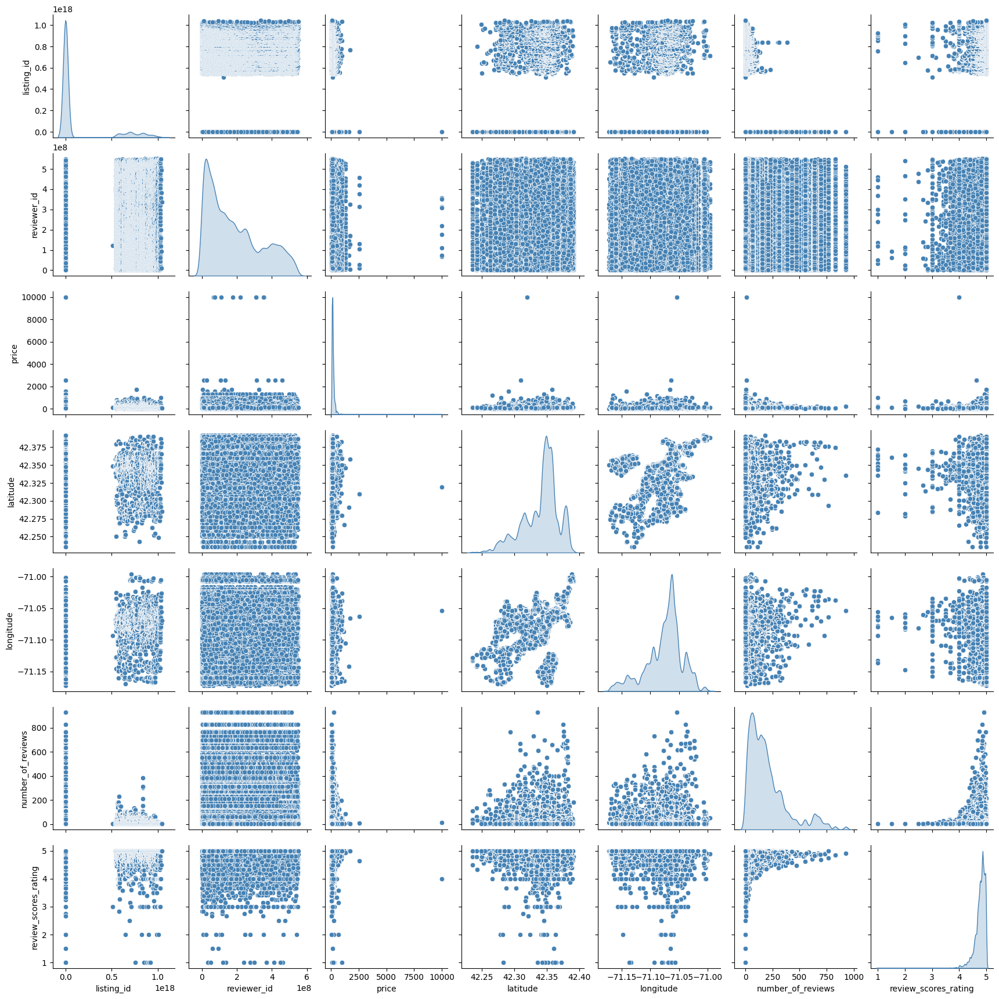

In [12]:
sns.set_palette(['steelblue'])
sns.pairplot(data, diag_kind='kde')
plt.show()

In [13]:
comments_per_year = data['review_date'].dt.year.value_counts().sort_index()
print(comments_per_year)

review_date
2019    23636
2020     9681
2021    20950
2022    36577
2023    45533
Name: count, dtype: int64


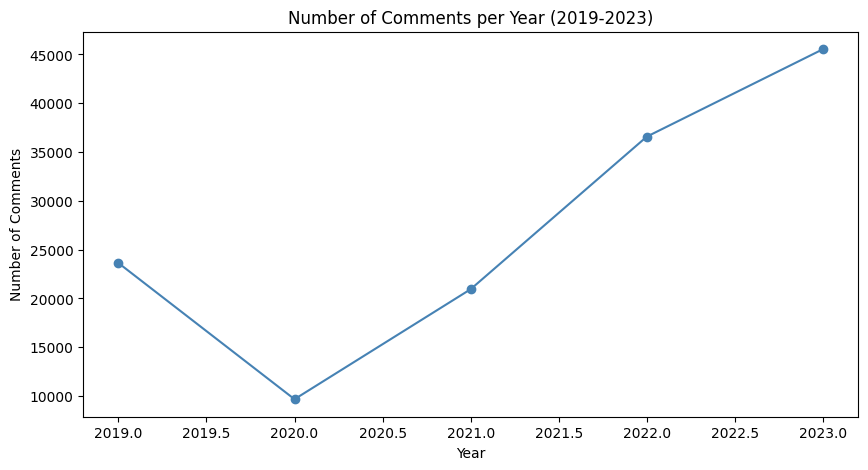

In [14]:
plt.figure(figsize=(10, 5))
comments_per_year.plot(kind='line', marker='o', color='steelblue')
plt.title('Number of Comments per Year (2019-2023)')
plt.xlabel('Year')
plt.ylabel('Number of Comments')
plt.xticks(rotation=0)
plt.show()


The reason why 2020 has the least reviews number is that the epidemic broke out in 2019 and the tourism and hotel industry developed sluggishly. As the epidemic gradually improves, the tourism industry recovers, and the homestay industry gradually returns to normal. This also explains why the number of airbnb reviews dropped sharply in 2020, then increased year by year and returned to a stable level.

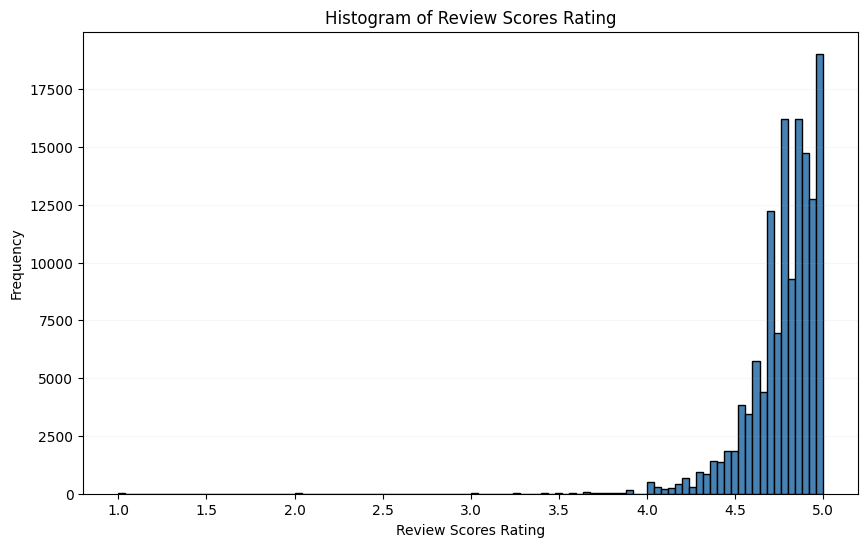

In [15]:
# Histogram for 'review_scores_rating'
plt.figure(figsize=(10, 6))
plt.hist(data['review_scores_rating'], bins=100, color='steelblue', edgecolor='black')
plt.title('Histogram of Review Scores Rating')
plt.xlabel('Review Scores Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.1)
plt.show()

This histogram illustrates the distribution of hotel review scores, primarily showing higher guest satisfaction. Scores range from 20 to 100, with most hotels scoring higher, indicating that most guests had a positive experience. Low-scoring hotels are rare and stand out for the overall quality of accommodation provided and guest satisfaction.

In [16]:
room_counts = data['room_type'].value_counts().sort_index()
print(room_counts)

room_type
Entire home/apt    93020
Hotel room           377
Private room       42277
Shared room          703
Name: count, dtype: int64


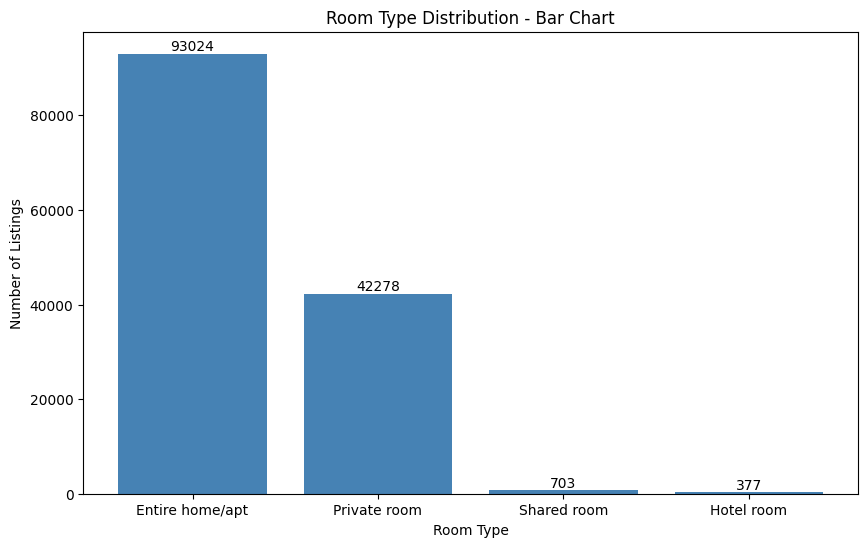

In [17]:
import matplotlib.pyplot as plt

room_counts = {
    'Entire home/apt': 93024,
    'Hotel room': 377,
    'Private room': 42278,
    'Shared room': 703
}

sorted_room_counts = dict(sorted(room_counts.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_room_counts.keys(), sorted_room_counts.values(), color='steelblue')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.title('Room Type Distribution - Bar Chart')
plt.xlabel('Room Type')
plt.ylabel('Number of Listings')
plt.show()

The chart displays the number of listings for four different room types: Entire home/apt, Private room, Shared room, and Hotel room. The highest number of listings is for Entire home/apt with 93,024, followed by Private room with 42,278, Shared room with 703, and Hotel room with 377. According to the chart, entire homes or apartments are the most frequently listed type of accommodation, while hotel rooms are the least common among the categories presented.

# 3. Text Mining

Make a copy of the data to avoid any disruption.

In [95]:
data.info()
data1 = data.copy()

<class 'pandas.core.frame.DataFrame'>
Index: 136377 entries, 14 to 182481
Data columns (total 11 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   listing_id              136377 non-null  int64         
 1   review_date             136377 non-null  datetime64[ns]
 2   reviewer_id             136377 non-null  int64         
 3   comments                136377 non-null  object        
 4   neighbourhood_cleansed  136377 non-null  object        
 5   price                   136377 non-null  float64       
 6   latitude                136377 non-null  float64       
 7   longitude               136377 non-null  float64       
 8   room_type               136377 non-null  object        
 9   number_of_reviews       136377 non-null  int64         
 10  review_scores_rating    136377 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3), object(3)
memory usage: 12.5+ MB


## 3.1 Detect for non-English words


In [96]:
!pip install langdetect

Defaulting to user installation because normal site-packages is not writeable


In [97]:
import pandas as pd
from langdetect import detect, LangDetectException
#define a function to check the language version
def detect_language_safe(text):
    try:
        return detect(text)
    except LangDetectException:
        return None


data['language'] = data['comments'].apply(detect_language_safe)


non_english_comments_count = data[data['language'] != 'en'].shape[0]

print(f"The number of not English version reviews is: {non_english_comments_count}")

The number of not English version reviews is: 8424


/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/2010232230.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['language'] = data['comments'].apply(detect_language_safe)


Based on the result of printing, it is obvious that the `comments` contain some non-English words, which cannot be easily understood and analyzed by the word package. We decided to select only English words.

## 3.2 Using Regex to clean text

1. convert all text inside `comments` to lower case;
2. remove punctuation and special characters;
3. remove digits if irrelevant;
4. normalize whitespace to single space

In [98]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')

data['comments'] = data['comments'].str.lower()
data['comments'] = data['comments'].str.replace(r"[^\w\s']", '')
data['comments'] = data['comments'].str.replace(r'\d+', '', regex=True)
data['comments'] = data['comments'].str.replace(r'\s+', ' ', regex=True)
data['comments'] =data['comments'].str.strip()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/danni.brownie/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/danni.brownie/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/danni.brownie/nltk_data...
[nltk_data]   Package words is already up-to-date!
/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/2479037325.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['comments'] = data['comments'].str.lower()
/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/2479037325.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy

## 3.3 Tokenization

1. remove stopwrods, short words, and non-English words;
2. return a list of words tokenized from `comments`;

In [99]:
english_words = set(nltk.corpus.words.words())

def remove_stopwords(sent):
    stop_word = set(stopwords.words('english'))
    words = word_tokenize(sent)
    filter_word = [x for x in words if x not in stop_word and len(x)>2 and x in english_words]
    return filter_word

data['comments'] = data['comments'].apply(remove_stopwords)
comments = data['comments']
list_doc = comments.tolist()

/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/4217453111.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['comments'] = data['comments'].apply(remove_stopwords)


/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/1290670125.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_dist['Number_of_words'],kde = False,color="steelblue", bins = 100)


Text(0.5, 1.0, 'Frequency distribution of number of words for each text extracted')

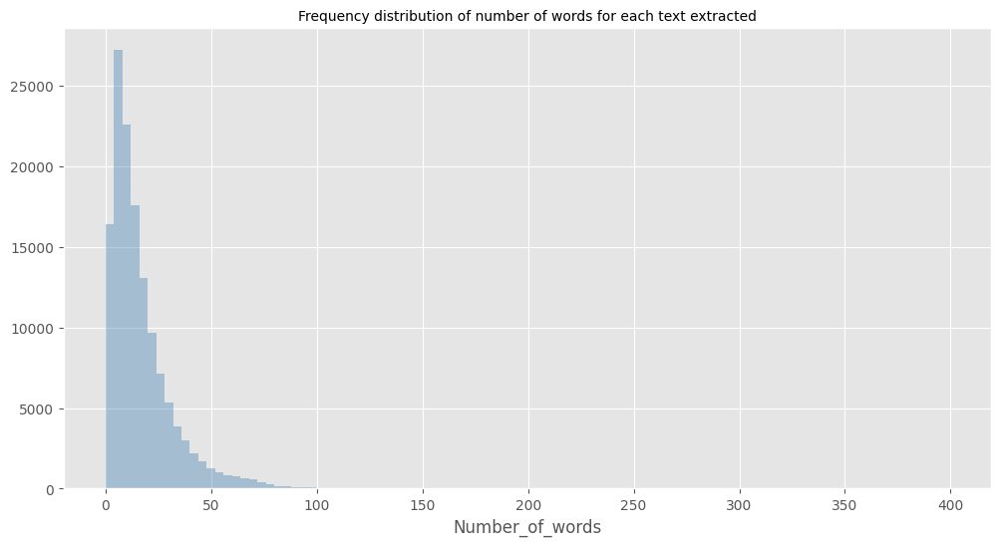

In [100]:
text_strs = [' '.join(sublist) for sublist in list_doc]
data_dist = pd.DataFrame({'text': text_strs})
data_dist['Number_of_words'] = data_dist['text'].apply(lambda x: len(str(x).split()))
plt.style.use('ggplot')
plt.figure(figsize=(12,6))
sns.distplot(data_dist['Number_of_words'],kde = False,color="steelblue", bins = 100)
plt.title("Frequency distribution of number of words for each text extracted", size=10)

The majority of Airbnb reviews are brief, with a marked decline in frequency as word count increases, emphasizing the need for careful text preprocessing as each word is crucial to the sentiment conveyed. Longer, detailed reviews are outliers, yet they provide a richer narrative of guest experiences. The predominance of concise reviews underscores the importance of context in each word for accurate sentiment analysis.

## 3.4 Word2Vec

In [101]:
!pip install gensim

Defaulting to user installation because normal site-packages is not writeable


In [102]:
import gensim
import gensim.downloader as api
import numpy as np
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

def word_lemmatizer(text):
    lem_text = [WordNetLemmatizer().lemmatize(i, pos='v') for i in text]
    return lem_text

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/danni.brownie/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [103]:
data["lemmatized"] = data["comments"].apply(lambda x: word_lemmatizer(x))
data["lemmatize_joined"] = data["lemmatized"].apply(lambda x: ' '.join(x))


/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/289065924.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["lemmatized"] = data["comments"].apply(lambda x: word_lemmatizer(x))
/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/289065924.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["lemmatize_joined"] = data["lemmatized"].apply(lambda x: ' '.join(x))


In [104]:
tokens = data['lemmatized']
w2v_model = Word2Vec(tokens,
                     min_count=600,
                     window=10,
                     vector_size=200,
                     alpha=0.03,
                     min_alpha=0.0007,
                     workers = 4,
                     seed = 42)

In [105]:
def get_word_embedding(word, model):
    if word in model.wv.key_to_index:
        return model.wv[word]
    else:
        return np.zeros(model.vector_size)


embeddings = []
for review in tokens:
  review_embeddings = [get_word_embedding(word, w2v_model) for word in review ]
  review_embedding = np.mean(review_embeddings if len(review_embeddings) >0 else [np.zeros(w2v_model.vector_size)], axis=0)
  embeddings = embeddings + [review_embedding]

embeddings = np.array(embeddings)

## 3.5 Word Cloud

Display the wordcloud for the entire `comments`

In [106]:
from sklearn.feature_extraction.text import CountVectorizer

Count the frequency of the words
 - generate term frequency list

In [107]:
comment = tokens.apply(' '.join)
cv = CountVectorizer()
counts_word = cv.fit_transform(comment)

vocab_freq = dict(zip(cv.get_feature_names_out(), counts_word.sum(axis = 0).A1))

- sort the term frequencies

In [108]:
sorted_comments = sorted(vocab_freq.items(), key=lambda item: item[1], reverse=True)

sorted_comments_dict = dict(sorted_comments)
print(sorted_comments_dict)

{'great': 76617, 'stay': 70627, 'place': 62652, 'location': 51134, 'clean': 43400, 'boston': 39181, 'would': 29506, 'nice': 23348, 'host': 23027, 'walk': 22706, 'apartment': 22406, 'comfortable': 21266, 'room': 20875, 'easy': 20445, 'everything': 20056, 'recommend': 19170, 'perfect': 18300, 'close': 16581, 'good': 16093, 'definitely': 16077, 'get': 14883, 'space': 14597, 'well': 14242, 'park': 14098, 'time': 13986, 'home': 13181, 'really': 13020, 'super': 12997, 'house': 11697, 'area': 11651, 'make': 11409, 'also': 11118, 'responsive': 10954, 'beautiful': 10845, 'need': 10728, 'quiet': 10296, 'back': 10229, 'neighborhood': 9938, 'check': 9909, 'highly': 9844, 'thank': 9432, 'amaze': 9383, 'one': 9290, 'bed': 9078, 'wonderful': 8911, 'helpful': 8774, 'kitchen': 8720, 'city': 8709, 'lot': 8697, 'convenient': 8605, 'like': 8564, 'street': 8386, 'could': 8131, 'come': 7862, 'bathroom': 7764, 'night': 7651, 'communication': 7639, 'distance': 7340, 'little': 7281, 'right': 7210, 'downtown': 

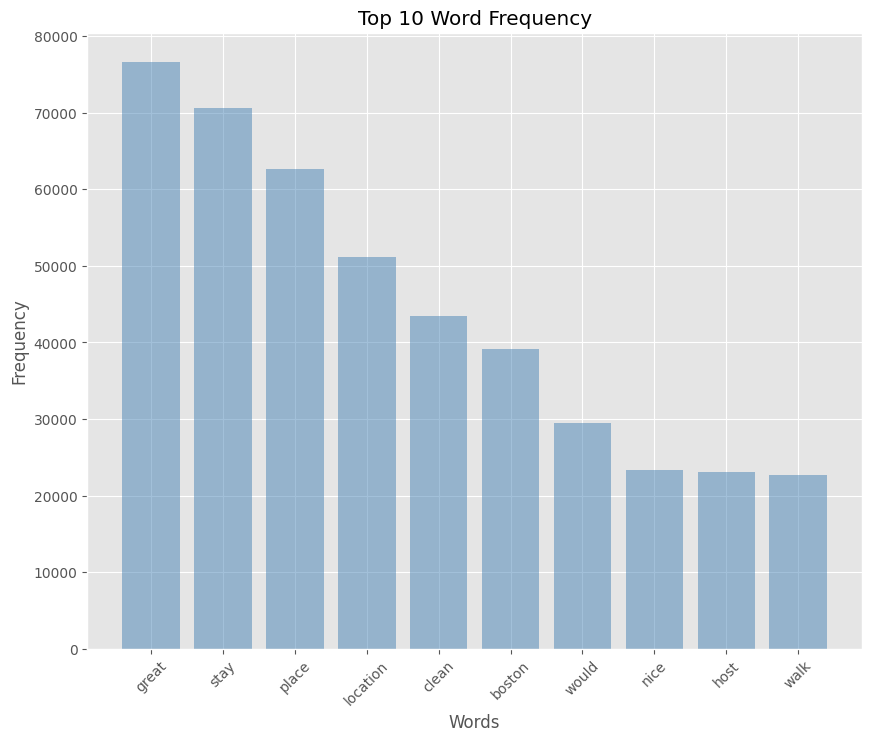

In [109]:
plt.figure(figsize=(10, 8))
keys = list(sorted_comments_dict.keys())
values = list(sorted_comments_dict.values())

keys = keys[:10]
values = values[:10]

y_pos = np.arange(len(keys))

plt.bar(y_pos, values, align='center', alpha=0.5, color='steelblue')
plt.xticks(y_pos, keys, rotation=45)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 10 Word Frequency')

plt.show()

In [110]:
!pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable


- create a word cloud using the frequencies

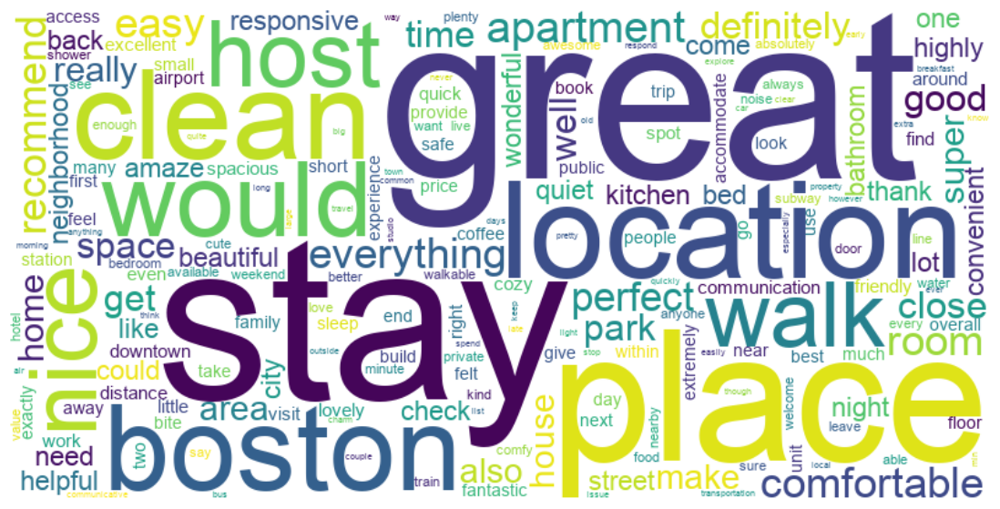

In [111]:
from wordcloud import WordCloud

font_path = '/Library/Fonts/Arial.ttf'
wordcloud = WordCloud(width=800, height=400, background_color='white', font_path=font_path)
wordcloud.generate_from_frequencies(vocab_freq)

# Display
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

The word cloud generated from Airbnb reviews emphasizes a highly positive guest experience, with "clean," "comfortable," "perfect," and "nice" being among the most prominent words, indicating that guests frequently appreciate the cleanliness and comfort of their accommodations. The standout term "location" suggests that the situational convenience of the properties is a highlight, with guests often mentioning proximity to local attractions and amenities. The sizeable appearance of "host" coupled with positive adjectives points to the importance of host-guest interactions, with guests often finding their hosts hospitable and helpful. The recurring word "recommend" reflects a general willingness of guests to endorse the listed properties to others. The word cloud portrays a generally positive sentiment in the reviews, with a focus on the physical attributes of the properties, the welcoming nature of the hosts, and the convenience of the locations.

# 4. T-SNE

T-SNE is mainly used to display high-dimensional figures in a lower-dimensional format. In this case, we are displaying words, which have a dimension of 200, in a 2-D figure.

In [112]:
from sklearn.manifold import TSNE

def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.index_to_key:
        tokens.append(model.wv[word])
        labels.append(word)

    tokens = np.array(tokens)

    tsne_model = TSNE(perplexity=50, n_components=2, init='pca', n_iter=2000, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(15, 13))
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

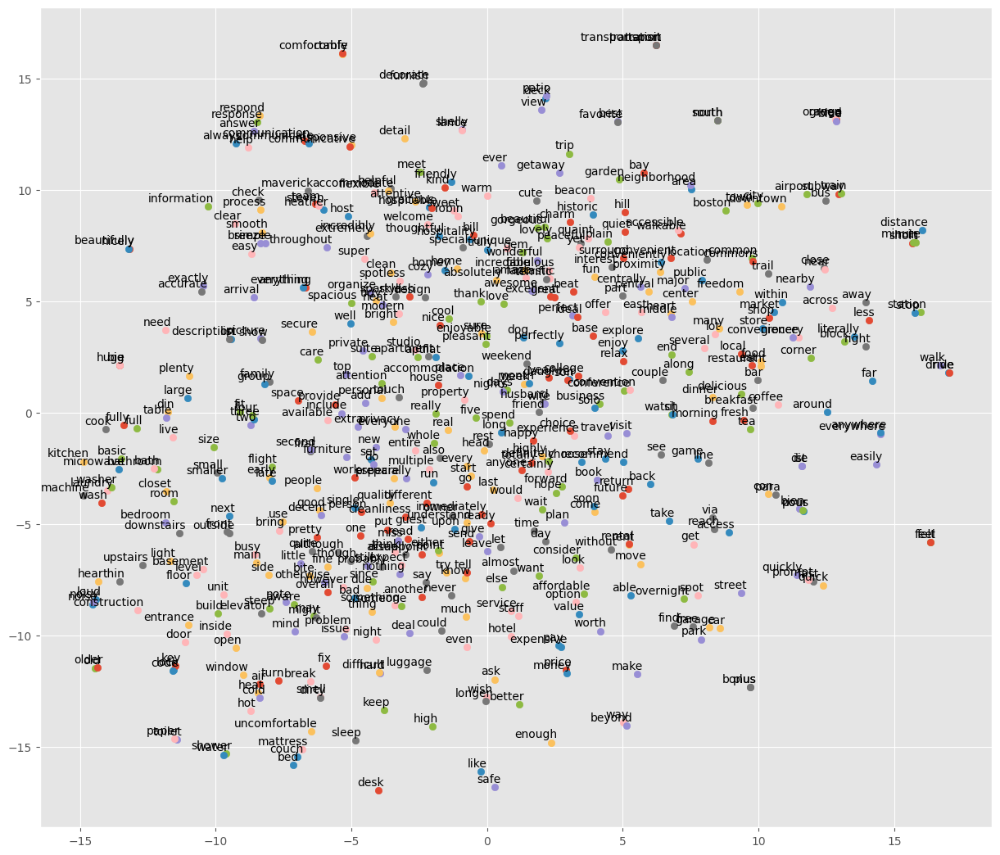

In [113]:
tsne_plot(w2v_model)

# 5. Sentiment analysis

In [114]:
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()

def get_sentiment(text, analyzer):
    sentence = ' '.join(text)
    sentiment_score = analyzer.polarity_scores(sentence)
    return sentiment_score['compound']

sentiments = np.array([get_sentiment(doc, sia) for doc in tokens])

threshold = 0.1
# positive: 1; neutral: 0; negative: -1
sentiment_labels = [1 if score > threshold else -1 if score < -threshold else 0 for score in sentiments]
data['sentiment_label'] = sentiment_labels

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/danni.brownie/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
/var/folders/hf/8k06pmmj1sd5gc5ldlgkwx2m0000gn/T/ipykernel_17771/792886804.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['sentiment_label'] = sentiment_labels


In [115]:
sentiment_counts = data['sentiment_label'].value_counts()
print(sentiment_counts)

sentiment_label
 1    126869
 0      7508
-1      2000
Name: count, dtype: int64


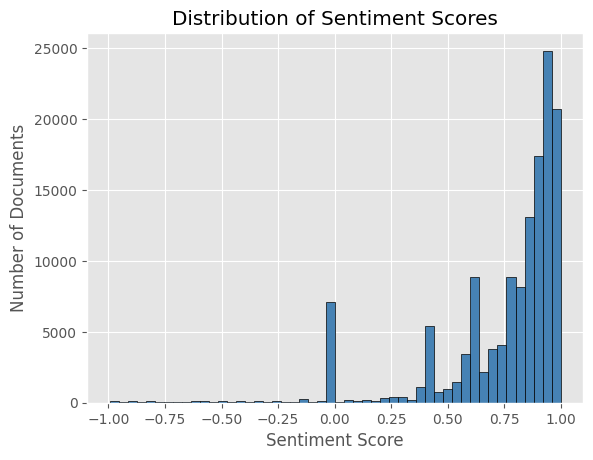

In [116]:
plt.hist(sentiments, bins=50, color='steelblue', edgecolor = 'black')
plt.title('Distribution of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Documents')
plt.show()

The histogram displays sentiment scores ranging from -1.00 to 1.00 on the horizontal axis and the number of documents on the vertical axis.  The sentiment scores are distributed in bins across the range, with each bar's height indicating the number of documents that fall within each bin's score range.

The histogram indicates that most reviews have a sentiment score close to 1.00, indicating a positive sentiment.  There are very few reviews with a score around 0 or negative scores. The chart indicates a skew towards positive sentiment scores in boston airbnb reviews.

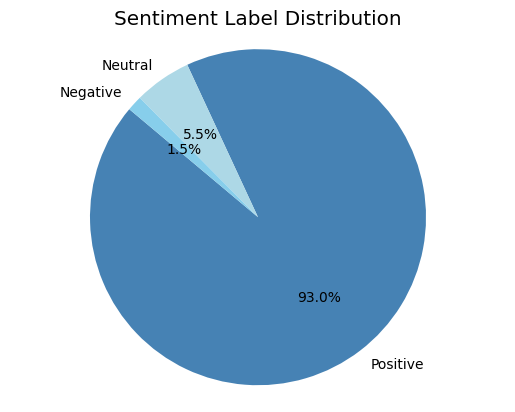

In [117]:
from collections import Counter
import matplotlib.pyplot as plt

sentiment_counts = Counter(sentiment_labels)
labels_ = ['Positive', 'Neutral', 'Negative']
sizes_ = [sentiment_counts[1], sentiment_counts[0], sentiment_counts[-1]]

colors = ['steelblue', 
          'lightblue',  
          'skyblue'] 

plt.pie(sizes, labels=labels_, colors=colors, autopct='%1.1f%%', startangle=140)
plt.axis('equal') 
plt.title('Sentiment Label Distribution')
plt.show()

93% of the reviews are positive, indicating an exceptional level of satisfaction among Airbnb users. Only 5.5% of reviews are neutral, showing that most guests have definitive opinions about their stays. A mere 1.5% of reviews are negative, suggesting infrequent but notable areas for improvement.

### Classify

In [118]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import sklearn
from sklearn.metrics import confusion_matrix

X_train, X_test, y_train, y_test = train_test_split(embeddings, data['sentiment_label'], test_size=0.2, random_state=42)

model_word2vec_classification = LogisticRegression()
model_word2vec_classification.fit(X_train, y_train)


y_pred2 = model_word2vec_classification.predict(X_test)

print(sklearn.metrics.classification_report(y_test,y_pred2))
cm = pd.DataFrame(confusion_matrix(y_test, y_pred2, normalize='true'), columns=model_word2vec_classification.classes_, index=model_word2vec_classification.classes_ )
cm

              precision    recall  f1-score   support

          -1       0.69      0.28      0.39       394
           0       0.80      0.78      0.79      1489
           1       0.98      0.99      0.99     25393

    accuracy                           0.97     27276
   macro avg       0.82      0.68      0.72     27276
weighted avg       0.97      0.97      0.97     27276



,-1,0,1
-1,0.276650,0.291878,0.431472
0,0.023506,0.775017,0.201478
1,0.000551,0.007010,0.992439


The classification report and confusion matrix indicate that the model performs well in identifying label 1 with high precision, recall, and f1-score, all around 0.98.  Label 0 also shows reasonable results with precision and recall scores of approximately 0.80 and 0.78, respectively.  However, label -1 has a notably lower recall of 0.28.  The overall performance is moderate, as reflected by the macro average.  The weighted average, which is influenced by the high support for label 1, shows excellent scores of 0.98 across precision, recall, and f1-score.  The confusion matrix supports these findings, with label 1 having a high true positive rate.  However, there are some misclassifications, particularly for label 0.  The model seems highly effective overall.  However, the lower performance on the minority class indicates potential imbalances in the dataset.

# 6. Topic Analysis using LDA

To analyze our data, we're going to use gensim to train an LDA model, which helps us uncover different topics within our text. First, we'll create a dictionary from our dataset, essentially mapping each unique word to a specific index. Then, using this dictionary, we'll construct what's called a 'corpus', a collection of texts where each word is identified by its dictionary index. Finally, we'll run LDA on this corpus. Our goal is to focus on topics numbered 3, 6, 9, 12, and 15, and for each of these topics, we'll extract and print the top five words that define them. This approach gives us a snapshot of the main themes running through our data.

Let's use the train_test_split function to split data now. We use 20% as test data and 80% of the total data as train data.

In [119]:
from sklearn.model_selection import train_test_split

#train_comments is used for set model
#test_comments is used for evaluate model
list_tokens = tokens.tolist()
train_comments, test_comments = train_test_split(list_tokens, test_size=0.2, random_state=42)

In [120]:
from gensim import corpora
dictionary_train = corpora.Dictionary(train_comments)
corpus_train = [dictionary_train.doc2bow(doc) for doc in train_comments]

Firstly, we are going to define a function to print the top words in each topic for LDA model.

In [121]:
def print_topic_words(model,num):
    for topic in range(model.num_topics):
        top_words = model.show_topic(topic, num)
        words = ", ".join([word[0] for word in top_words])
        print(f"Topic {topic}: {words}")

Then, we built LDA model.

In [122]:
def build_num_topic_model(dictionary_train, corpus_train, num_topics):

    for num_topic in num_topics:
        lda_model = models.ldamodel.LdaModel(corpus_train, num_topics=num_topic, id2word=dictionary_train)
        print(f"LDA model with {num_topic} topics:")
        print_topic_words(lda_model,5)
        print("\n")

Print the results to have a look.

In [123]:
from gensim import models
build_num_topic_model(dictionary_train, corpus_train, [3, 6, 9, 12, 15])

LDA model with 3 topics:
Topic 0: great, place, stay, location, clean
Topic 1: stay, great, place, boston, location
Topic 2: room, get, kitchen, park, bathroom


LDA model with 6 topics:
Topic 0: stay, get, night, would, place
Topic 1: room, bathroom, bed, good, nice
Topic 2: home, boston, make, stay, beautiful
Topic 3: great, stay, place, location, clean
Topic 4: park, boston, stay, place, easy
Topic 5: great, location, walk, boston, close


LDA model with 9 topics:
Topic 0: airport, close, boston, super, center
Topic 1: stay, home, place, boston, make
Topic 2: park, night, street, good, room
Topic 3: great, location, place, stay, clean
Topic 4: stay, clean, place, recommend, host
Topic 5: get, stay, could, would, one
Topic 6: walk, boston, location, distance, great
Topic 7: easy, stay, boston, great, place
Topic 8: room, kitchen, bathroom, bed, space


LDA model with 12 topics:
Topic 0: great, stay, location, place, clean
Topic 1: walk, boston, perfect, stay, distance
Topic 2: get, c

# 7. Model Evaluation

For the model evaluation part, we train topic models with various numbers of topics and then measure their coherence and perplexity. This helps us determine which model offers the most meaningful and consistent insights.

In [124]:
dictionary_test = corpora.Dictionary(test_comments)
corpus_test = [dictionary_test.doc2bow(doc) for doc in test_comments]

In [125]:
# perplexity
# run different number of topics to get perplexity and coherence value for this model
from gensim.models.coherencemodel import CoherenceModel
def get_measurement_for_model(dictionary_test, corpus_test, topic_nums):
    perplexity = []
    coherence_value=[]
    for num_topic in topic_nums:
        lda_model = models.ldamodel.LdaModel(corpus_test, num_topics=num_topic, id2word=dictionary_test)
        cohm = CoherenceModel(model=lda_model, corpus=corpus_test, coherence='u_mass')
        coherence_value.append(cohm.get_coherence())
        perplexity.append(lda_model.log_perplexity(corpus_test))

    return perplexity,coherence_value

In [126]:
perplexity, coherence = get_measurement_for_model(dictionary_test, corpus_test, [3, 6, 9, 12, 15, 20, 50])

In [127]:
print(perplexity)
print(coherence)

[-6.292503714605279, -6.384030126620578, -6.498847407842534, -6.753455558430751, -6.923457198851127, -7.11183207044007, -8.289586399289753]
[-2.0125515125619473, -2.040458709371997, -2.1434191789580064, -2.1208338650806753, -2.496462759652289, -3.147907826560323, -3.6655912611772776]


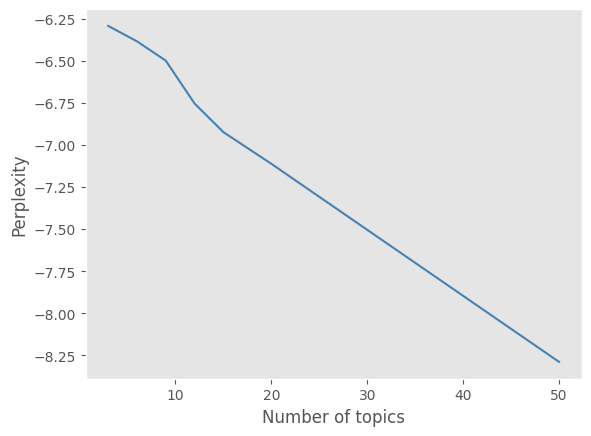

In [128]:
plt.plot([3, 6, 9, 12, 15, 20, 50], perplexity, color='steelblue')
plt.grid()
plt.xlabel("Number of topics")
plt.ylabel("Perplexity")
plt.show()

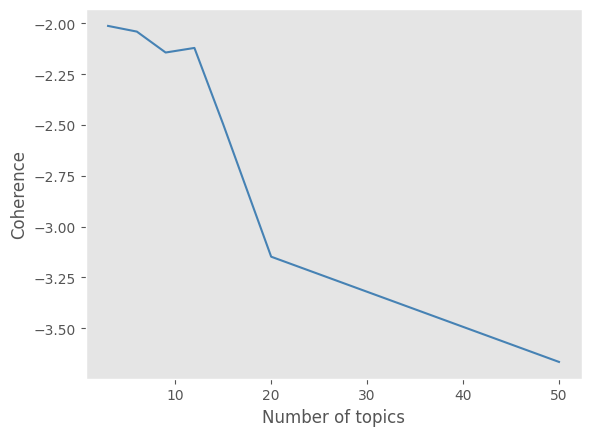

In [129]:
plt.plot([3, 6, 9, 12, 15, 20, 50], coherence, color='steelblue')
plt.grid()
plt.xlabel("Number of topics")
plt.ylabel("Coherence")
plt.show()

We observe that perplexity decreases with an increase in the number of topics, but coherence peaks at 3 topics, which may be insufficient for comprehensive analysis. Notably, coherence significantly diminishes beyond 15 topics, indicating a loss in topic distinction. Therefore, we determine that 15 topics represent an optimal balance, offering lower perplexity without a substantial compromise in coherence. We must also qualitatively assess the topics to confirm their relevance and distinctiveness.

# 8. Alpha and Eta in LDA

In Latent Dirichlet Allocation (LDA), the Alpha and Eta parameters play a crucial role in shaping the topic distribution and the word distribution within a topic, respectively. By examining their values and their impact on model performance, we can gain insight into the underlying structure of the topics discovered by the model. Alpha controls document topic density. Lower alpha values assign fewer topics to each document, while higher alpha values assign more topics to each document. Eta affects the keyword density. Similar to alpha, lower eta values result in a sparser distribution of keywords, while higher eta values result in a denser distribution of keywords. By comparing the coherence scores of the three models, we can determine the best combination of alpha and eta values that produce the most coherent topics. Higher coherence scores indicate that the topics generated by the model are more semantically coherent and interpretable. Through this analysis, we aim to determine the alpha and eta values that yield the most meaningful and coherent topics, providing valuable insights for topic modeling tasks.

In [53]:
from gensim import corpora, models
from gensim.models import CoherenceModel

# Creating a dictionary
dictionary = corpora.Dictionary(list_doc)

# Corpus needed for Topic Modeling
corpus = [dictionary.doc2bow(text) for text in list_doc]

# Print the words in topics with their weights
def print_topic_words(model, num_top_words):
    for topic_id in range(model.num_topics):
        words = model.show_topic(topic_id, topn=num_top_words)
        topic_words = ", ".join([word for word, _ in words])
        print(f"Topic {topic_id}: {topic_words}")

In [54]:
# model 1: LDA with symmetric alpha
lda_model1 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='symmetric')
print_topic_words(lda_model1, 10)

Topic 0: recommend, home, host, highly, place, stay, clean, would, responsive, beautiful
Topic 1: room, kitchen, bathroom, nice, bed, clean, comfortable, living, space, well
Topic 2: walk, station, close, minute, away, train, line, boston, downtown, subway
Topic 3: stay, sure, everything, make, boston, made, bien, could, went, property
Topic 4: stay, place, would, perfect, definitely, everything, back, amazing, clean, location
Topic 5: good, small, people, space, place, location, bit, two, overall, group
Topic 6: apartment, perfect, boston, beautiful, wonderful, family, location, stay, space, well
Topic 7: one, night, unit, could, get, noise, room, would, apartment, also
Topic 8: felt, safe, check, book, much, easy, thank, clean, description, always
Topic 9: parking, street, park, car, across, building, find, easy, spot, apartment
Topic 10: walking, boston, location, distance, great, within, end, apartment, right, north
Topic 11: easy, great, close, place, boston, stay, clean, location

In [55]:
# evaluate the models using Coherence Score
coherence_model_lda1 = CoherenceModel(model=lda_model1, texts=list_doc, dictionary=dictionary, coherence='c_v')
coherence_lda1 = coherence_model_lda1.get_coherence()

print("\nCoherence Score for Model 1:", coherence_lda1)

/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently t


Coherence Score for Model 1: 0.5714595094688766


In [56]:
# model 2: LDA with asymmetric alpha and fixed Eta
lda_model2 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='asymmetric', eta=0.5)
print_topic_words(lda_model2, 10)

Topic 0: clean, stay, place, great, host, recommend, responsive, location, would, comfortable
Topic 1: stay, great, place, boston, would, location, perfect, definitely, everything, back
Topic 2: apartment, walking, kitchen, distance, boston, location, comfortable, great, well, within
Topic 3: great, location, place, good, stay, nice, easy, clean, host, price
Topic 4: dan, bien, pour, nous, look, care, boston, forward, taken, tout
Topic 5: boston, family, perfect, day, place, stayed, space, city, went, back
Topic 6: parking, hotel, street, staff, find, spot, car, park, free, garage
Topic 7: home, felt, like, thank, house, beautiful, stay, feel, time, wonderful
Topic 8: host, stay, best, even, place, ever, sure, provided, experience, made
Topic 9: check, early, easy, flexible, fast, late, flight, hill, let, beacon
Topic 10: walk, station, minute, close, boston, train, airport, line, get, easy
Topic 11: para, con, die, excelente, boston, ist, east, man, newly, las
Topic 12: would, night, 

In [57]:
# evaluate the models using Coherence Score
coherence_model_lda2 = CoherenceModel(model=lda_model2, texts=list_doc, dictionary=dictionary, coherence='c_v')
coherence_lda2 = coherence_model_lda2.get_coherence()

print("Coherence Score for Model 2:", coherence_lda2)

/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently t

Coherence Score for Model 2: 0.5356863396892418


In [58]:
# model 3: LDA with auto alpha and Eta
lda_model3 = models.LdaModel(corpus, num_topics=15, id2word=dictionary, passes=1, alpha='auto', eta='auto')
print_topic_words(lda_model3, 10)

Topic 0: night, room, bit, noise, overall, floor, people, little, nice, good
Topic 1: place, nice, clean, stay, would, super, comfortable, responsive, definitely, really
Topic 2: back, come, hotel, would, definitely, stay, group, cool, book, place
Topic 3: room, bed, bathroom, kitchen, comfortable, small, one, living, stayed, bedroom
Topic 4: walking, easy, distance, check, within, access, process, boston, everything, location
Topic 5: parking, street, find, park, car, across, apartment, noise, free, spot
Topic 6: great, location, stay, place, clean, host, would, responsive, apartment, recommend
Topic 7: stay, boston, perfect, place, absolutely, amazing, beautiful, best, wonderful, everything
Topic 8: home, house, felt, like, beautiful, stay, feel, thank, host, comfortable
Topic 9: check, host, early, bien, late, arrival, pour, nous, even, let
Topic 10: apartment, boston, location, end, property, well, north, building, unit, walkable
Topic 11: good, public, transportation, clean, easy,

In [59]:
# evaluate the models using Coherence Score
coherence_model_lda3 = CoherenceModel(model=lda_model3, texts=list_doc, dictionary=dictionary, coherence='c_v')
coherence_lda3 = coherence_model_lda3.get_coherence()

print("Coherence Score for Model 3:", coherence_lda3)

/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/danni.brownie/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently t

Coherence Score for Model 3: 0.5983389663517187


Based on the models, we are able to reveals the nuanced impact of alpha and eta parameters on the topic modeling results. The model undergoes multiple passes over the corpus, typically until convergence criteria are met. We set passes equal to 1 due to heavy training time. Using higher number of passes can improve model convergence and stability but comes with increased computational cost. In model 1, symmetric alpha values were utilized, resulting in an equal prior probability for all topics. The topics exhibited varying degrees of coherence, with a coherence score of 0.571. Model 2 employed asymmetric alpha and fixed eta parameters, allowing for different prior probabilities for each topic and a fixed topic-word density, respectively. Despite the fixed eta value of 0.5, the coherence score was slightly lower at 0.536. In contrast, Model 3 employed auto alpha and eta parameters, enabling the model to adaptively learn prior distributions from the data. This approach yielded the highest coherence score of 0.598, indicating more interpretable and semantically coherent topics. As conclusion, we can see the analysis undersocre the importance of parameter selection in LDA models. For our project, auto alpha and eta demonstrating superior performance in capturing the underlying structure of textual data.


# 9. LDA Visualization

## 9.1 Word Cloud

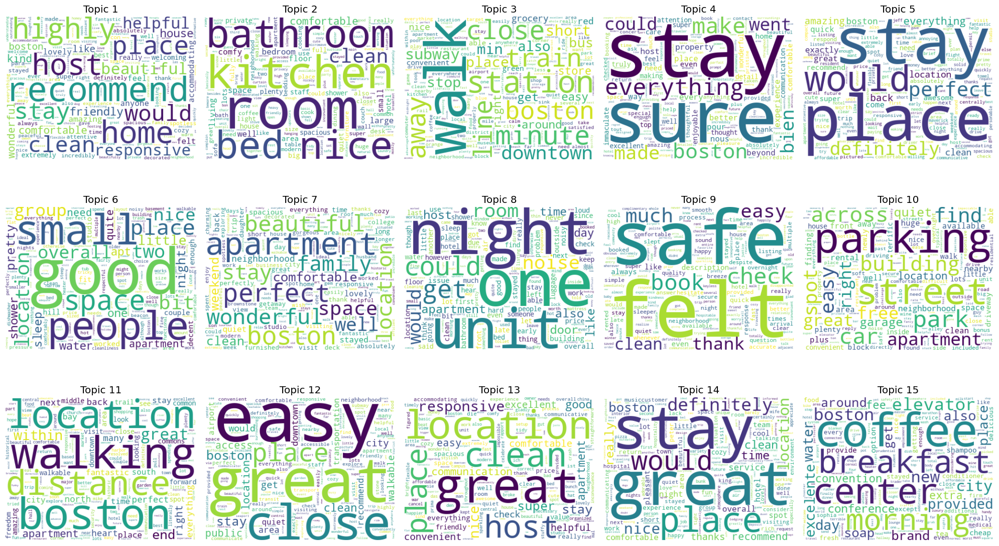

In [60]:
# model 1

import matplotlib.pyplot as plt
from wordcloud import WordCloud

num_topics = lda_model1.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model1.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

The model 1 word cloud emphasizes the most frequently mentioned terms within each topic. For example, Topic 1 highlights positive attributes such as "helpful host," "beautiful place," and "highly recommend," suggesting satisfaction with the hospitality. Topic 2 focuses on the "bathroom" and "clean," indicating cleanliness and amenities as important factors. Each topic appears to encapsulate specific aspects of guest experiences, ranging from the location and ease of transportation (Topics 3 and 12) to the quality of the apartment (Topic 7), safety concerns (Topic 9), parking conveniences (Topic 10), and proximity to city centers or walking distances to attractions (Topic 11).

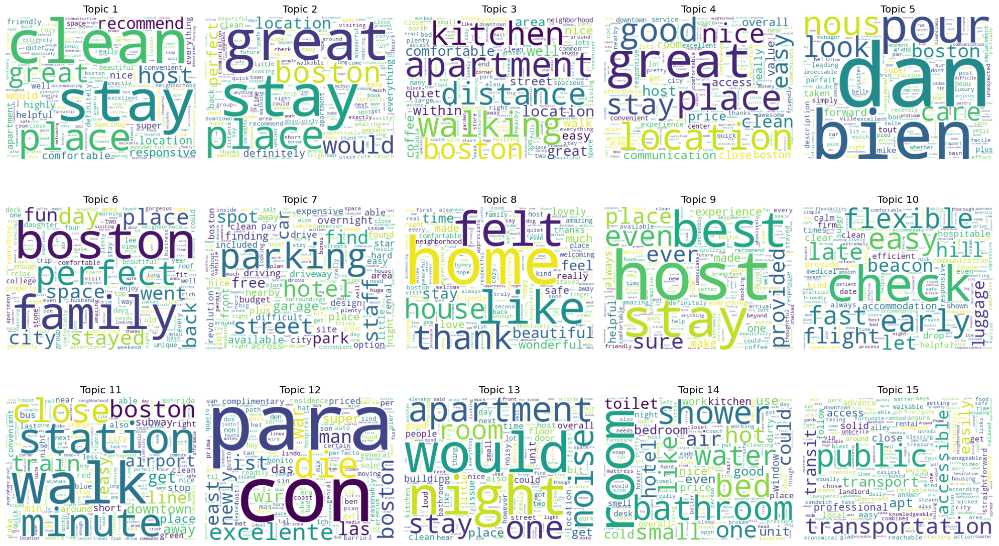

In [61]:
# model 2

num_topics = lda_model2.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model2.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

The model 2 word cloud prominent words across various topics include "stay," "place," "clean," "Boston," "location," "apartment," "great," "host," "recommend," "home," "easy," and "parking." These word clouds suggest that guests value a clean and comfortable environment, a convenient location, the quality of hosting, and the ease of parking. 

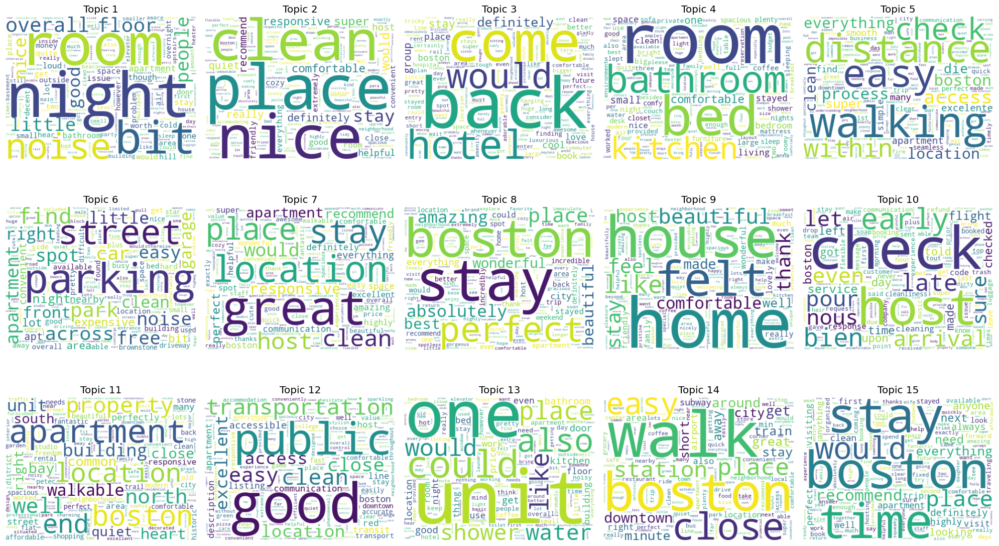

In [62]:
# model 3

num_topics = lda_model3.num_topics

# Subsets
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

# Generate the word cloud
for t in range(num_topics):
    words_freq = dict(lda_model3.show_topic(t, 200))
    wc = WordCloud(background_color='white', width=400, height=300)
    wc.generate_from_frequencies(words_freq)

    axes[t].imshow(wc, interpolation='bilinear')
    axes[t].axis('off')
    axes[t].set_title(f'Topic {t+1}')

for ax in axes[num_topics:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

The model 3 word cloud prominent terms are "stay," "Boston," "place," "clean," "location," "room," "parking," "easy," "nice," "home," "hotel," "check," and "host." These words suggest that guests value cleanliness, a convenient location, the ease of parking, comfortable rooms, and friendly hosts. The term "night" alongside "noise" indicates that some guests might have experienced disturbances during their stay. Words like "perfect," "recommend," and "great" reflect overall positive experiences, while the focus on "Boston" suggests that the proximity to or the experience of the city itself is a significant factor for guests. The repetition of the word "stay" in various contexts emphasizes the importance of the overall experience while renting these accommodations.

In [63]:
positive_docs = [list_doc[i] for i, sentiment in enumerate(data['sentiment_label']) if sentiment == 1]
negative_docs = [list_doc[i] for i, sentiment in enumerate(data['sentiment_label']) if sentiment == -1]

In [64]:
# Create dictionaries for positive and negative documents
positive_dictionary = corpora.Dictionary(positive_docs)
negative_dictionary = corpora.Dictionary(negative_docs)

# Create corpora for positive and negative documents
positive_corpus = [positive_dictionary.doc2bow(text) for text in positive_docs]
negative_corpus = [negative_dictionary.doc2bow(text) for text in negative_docs]

In [65]:
# Correct way to get topic distributions for positive documents
positive_topic_distributions = [lda_model3.get_document_topics(item) for item in positive_corpus]

# Correct way to get topic distributions for negative documents
negative_topic_distributions = [lda_model3.get_document_topics(item) for item in negative_corpus]

In [66]:
# Apply LDA model to the positive corpus
positive_lda = lda_model3[positive_corpus]

# Apply LDA model to the negative corpus
negative_lda = lda_model3[negative_corpus]

In [67]:
# Get the topic distribution for each document
topic_distributions = [lda_model3.get_document_topics(item) for item in corpus]

In [68]:
# Find the dominant topic for each document
dominant_topics = [sorted(topics, key=lambda x: x[1], reverse=True)[0][0] for topics in topic_distributions]

In [69]:
data_with_topics_and_sentiments = pd.DataFrame({
    'Dominant_Topic': dominant_topics,
    'Sentiment_Label': sentiment_labels
})

In [70]:
topic_sentiment_matrix = pd.crosstab(data_with_topics_and_sentiments['Dominant_Topic'], data_with_topics_and_sentiments['Sentiment_Label']) 

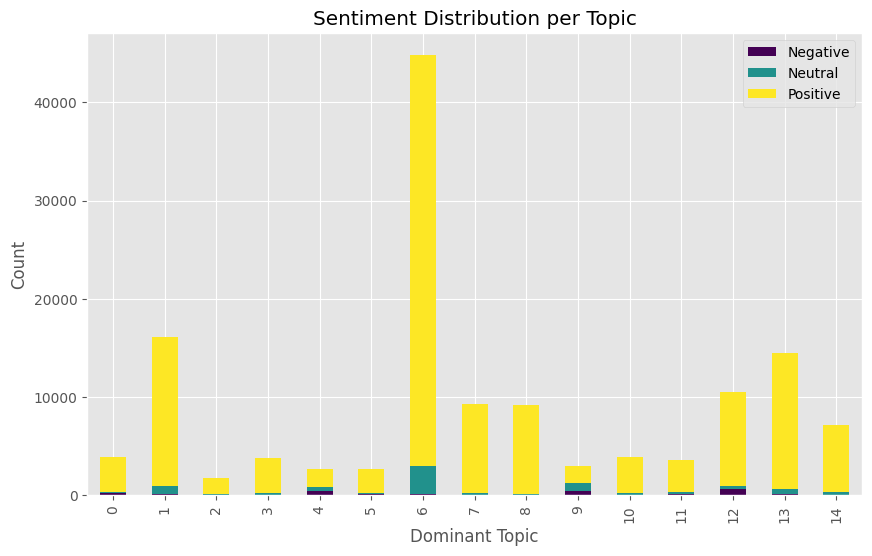

In [71]:
topic_sentiment_matrix.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='viridis')
plt.title('Sentiment Distribution per Topic')
plt.xlabel('Dominant Topic')
plt.ylabel('Count')
plt.legend(['Negative', 'Neutral', 'Positive'])
plt.show()

The stacked bar chart visualizes sentiment distribution across fifteen different topics derived from an LDA model. It shows that the majority of the content is overwhelmingly positive, especially for a particularly dominant topic labeled as Topic 6. The chart also indicates minimal presence of neutral and negative sentiments across all topics, suggesting a generally positive tone in the dataset.

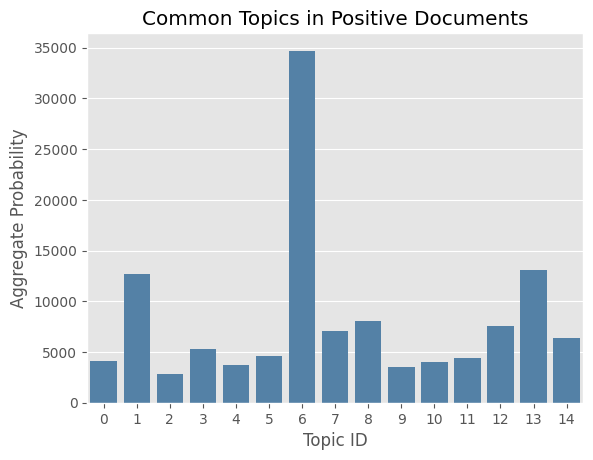

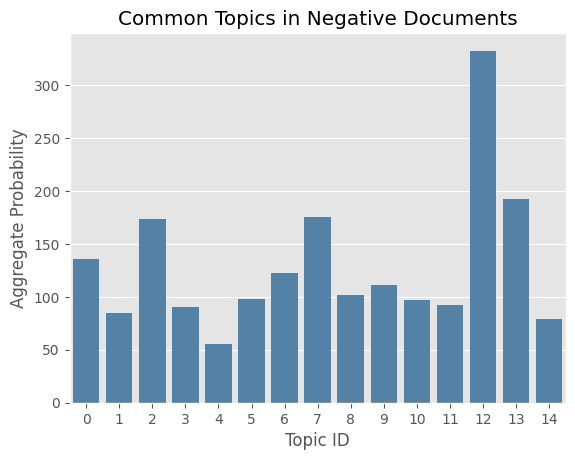

In [72]:
def plot_common_topics(topic_distributions, title):
    # Aggregate topic presence across all documents
    topic_presence = {}
    for doc in topic_distributions:
        for topic, prob in doc:
            topic_presence[topic] = topic_presence.get(topic, 0) + prob
    
    # Sort topics by aggregated presence
    sorted_topics = sorted(topic_presence.items(), key=lambda x: x[1], reverse=True)
    topics, presences = zip(*sorted_topics)

    # Plot using keyword arguments for x and y
    sns.barplot(x=list(topics), y=list(presences), color='steelblue')
    plt.title(title)
    plt.xlabel('Topic ID')
    plt.ylabel('Aggregate Probability')
    plt.show()

plot_common_topics(positive_topic_distributions, "Common Topics in Positive Documents")
plot_common_topics(negative_topic_distributions, "Common Topics in Negative Documents")

The graph provided depicts the prevalence of themes in Airbnb reviews, with Theme 6 clearly dominating positive reviews, indicating that guests discussed a key positive aspect. In contrast, negative reviews show a more even distribution of topics, with topics 0 and 8 being slightly more prevalent, indicating a range of issues affecting guest satisfaction. This data highlights specific areas of the guest experience that correlate with guest emotional congruence.

In [73]:
positive_lda = models.LdaModel(positive_corpus, num_topics=15, id2word=positive_dictionary)
negative_lda = models.LdaModel(negative_corpus, num_topics=15, id2word=negative_dictionary)

In [74]:
def topics_to_df(lda_model, num_words):
    topic_dict = {}
    for i in range(lda_model.num_topics):
        words = lda_model.show_topic(i, topn=num_words)
        topic_dict[f"Topic {i}"] = [word for word, weight in words]
    return pd.DataFrame(topic_dict)

# For positive topics
positive_topics_df = topics_to_df(positive_lda, 10)
print("Positive Topics:")
print(positive_topics_df)

# For negative topics
negative_topics_df = topics_to_df(negative_lda, 10)
print("Negative Topics:")
print(negative_topics_df)

Positive Topics:
     Topic 0        Topic 1   Topic 2    Topic 3 Topic 4  Topic 5    Topic 6  \
0      house          great     place      check    like   boston       home   
1      early       location     close   location   hotel  perfect      thank   
2      night          place      walk    amazing    felt  parking       stay   
3     coffee           stay    boston      quick    room     spot  wonderful   
4  breakfast          clean     great       easy    home  weekend       host   
5    morning           good      easy       stay    feel   family      place   
6        day           nice      stay  recommend  really     trip  beautiful   
7       late           host     clean      great    sure     city     lovely   
8       nice  communication  downtown  beautiful    make    place     better   
9        air           easy   station      staff    made      car       much   

     Topic 7   Topic 8     Topic 9     Topic 10  Topic 11 Topic 12   Topic 13  \
0    walking      roo

Positive Topics Word Clouds:


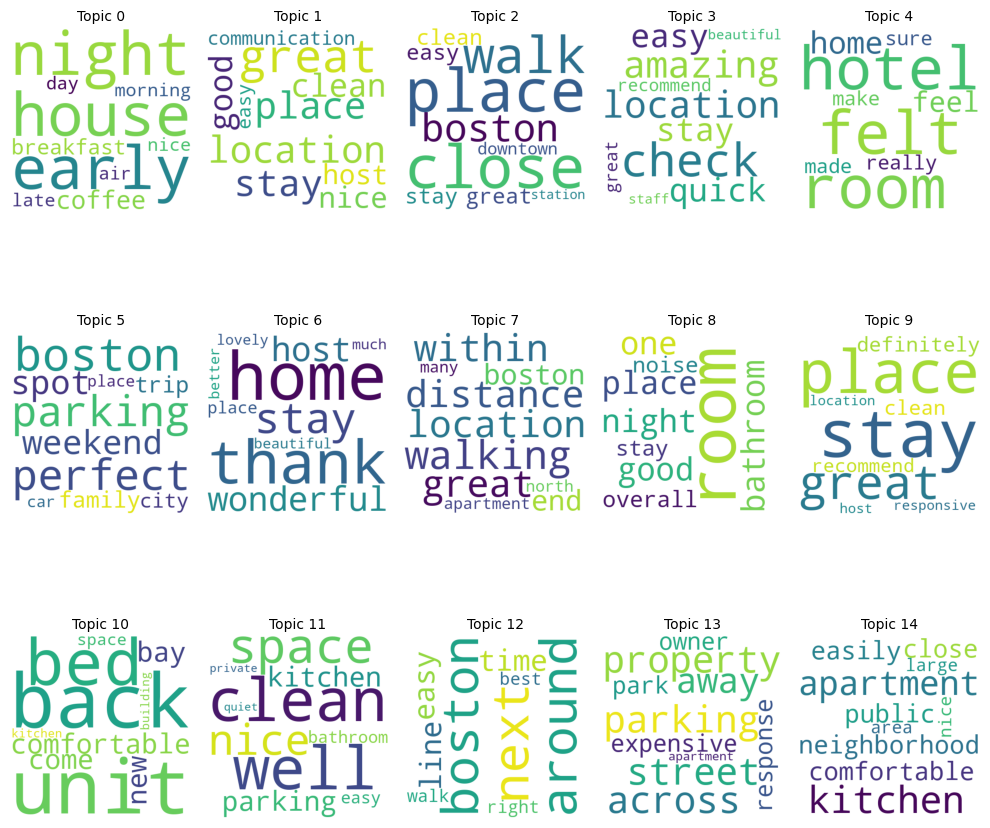

In [75]:
def generate_wordclouds(topics_df):
    fig, axes = plt.subplots(3, 5, figsize=(10, 10)) 
    axes = axes.flatten()

    for i in range(15):
        topic_words = ' '.join(topics_df.iloc[:, i])
        wordcloud = WordCloud(width=400, height=400, background_color ='white').generate(topic_words)
        axes[i].imshow(wordcloud)
        axes[i].axis('off')
        axes[i].set_title(f'Topic {i}', fontsize=10)

    plt.tight_layout()
    plt.show()

# Positive topics word clouds
print("Positive Topics Word Clouds:")
generate_wordclouds(positive_topics_df)

This word cloud represents the most common words found in positive Airbnb reviews, organized by topic. Larger words indicate higher frequency. For example, theme 6 emphasizes “host”, “clean” and “house”, indicating that guests value warm service and cleanliness. Theme 9 contains words such as "home," "come back," and "stay," which may indicate guests' appreciation of a home-like environment. Each theme reflects a different aspect of the guest experience, from the practicality of location and facilities to the comfort and aesthetics of the hotel.

Negative Topics Word Clouds:


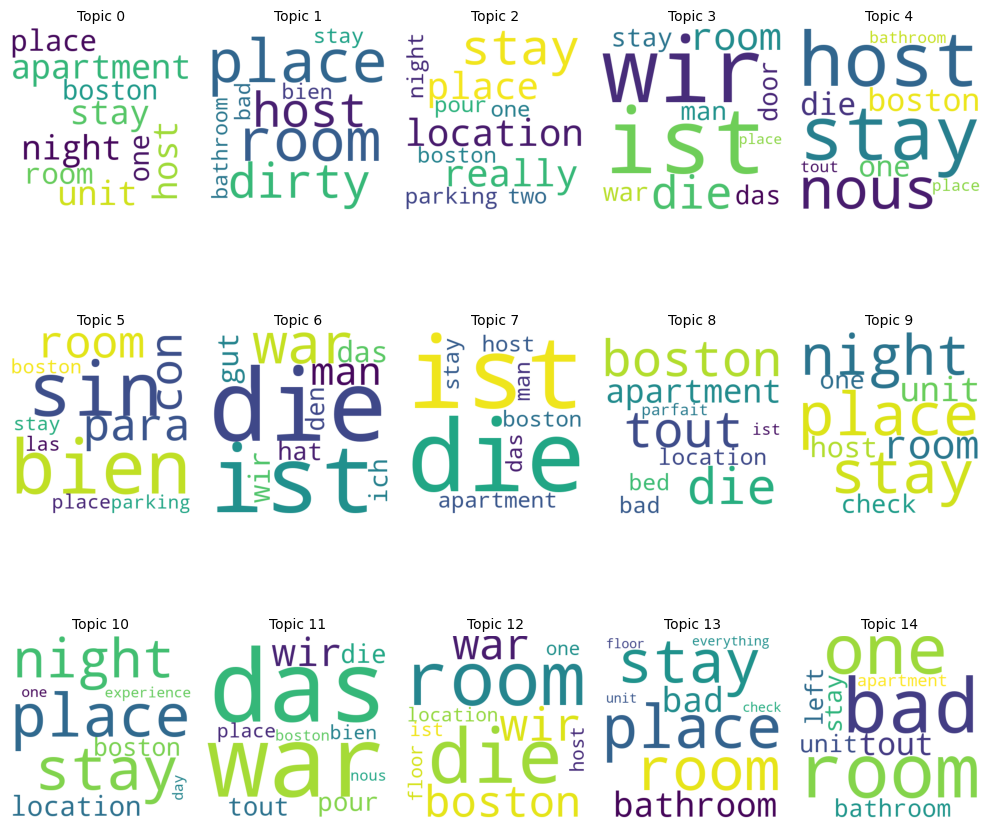

In [76]:
# Negative topics word clouds
print("Negative Topics Word Clouds:")
generate_wordclouds(negative_topics_df)

The word cloud visualizes common terms found in negative Airbnb reviews, with each topic representing a different aspect of guest concern. Issues such as "noise", "dirty", "room", "bathroom" were prominent, indicating dissatisfaction with cleanliness and noise levels. This data is critical in identifying specific areas to improve the guest experience.

## 9.2 Intertopic Distance Map


The `pyLDAvis.gensim_models` module is a powerful visualization tool for anyone working with text data. It brings to life the abstract and often complex topic models created by LDA by turning them into interactive, easy-to-understand visualizations. With this tool, we can see clusters of topics laid out on a plane, showing how topics relate to each other and the prevalence of each topic in our data set.

In [77]:
!pip install pyLDAvis
!pip install --upgrade joblib
!pip install --upgrade pyLDAvis

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [78]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# model 1
lda_vis = gensimvis.prepare(lda_model1, corpus, dictionary)
pyLDAvis.display(lda_vis)

In [79]:
# model 2
lda_vis = gensimvis.prepare(lda_model2, corpus, dictionary)
pyLDAvis.display(lda_vis)

In [80]:
# model 3
lda_vis = gensimvis.prepare(lda_model3, corpus, dictionary)
pyLDAvis.display(lda_vis)

# 10. Conclusions

We utilized T-SNE to visualize word data, allowing for an intuitive understanding of word relationships and clustering. The VADER tool was employed to analyze sentiment in Airbnb reviews, revealing a general positive trend. To classify sentiments with precision, we applied logistic regression models using Word2Vec embeddings.

For topic analysis, we trained an LDA model using a specially crafted dictionary and corpus, focusing on service quality and cleanliness. Various model preparation strategies were employed for interpreting the LDA outcomes.

The LDA models underwent extensive evaluation, with adjustments made to the alpha and eta parameters to enhance topic and keyword distribution. Word clouds provided qualitative insights, underpinning the themes in guest feedback and guiding future research to refine the LDA model.

The comprehensive analysis of Boston Airbnb reviews provides us with valuable insights into guest preferences, highlighting key factors contributing to their satisfaction and pinpointing opportunities for hosts to improve their service.  Our findings underscore the importance of cleanliness, quietness, and hospitality as the cornerstones of a positive guest experience.  These elements not only enhance satisfaction but also encourage repeat visits, contributing to the growth and reputation of Boston's Airbnb market.

Based on our analysis, we strongly advise Airbnb hosts to focus on maintaining impeccable standards of cleanliness, actively manage noise levels, and create a welcoming and friendly atmosphere.  Ensuring that the property descriptions accurately reflect the reality can help manage guest expectations and prevent potential disappointments.

To further elevate the guest experience, hosts could consider personal touches that make a stay memorable, such as offering local recommendations or small amenities.  Consistently delivering on these aspects can lead to better reviews, higher ratings.

# 11. Challenges
Data Cleaning and Preprocessing Challenges:
A major obstacle was ensuring the cleanliness and readiness of data for analysis. The reviews are important to our sentiment analysis. They were fraught with linguistic challenges such as slang, spelling errors, and diverse language usage. This complexity made the extraction of accurate sentiments from the text a complicated task.

Navigating Sentiment Ambiguities:
The sentiment analysis was further complicated by the presence of mixed emotions in the reviews. Guests often mentioned both positive and negative aspects in a single review, presenting a challenge in accurately capturing the overarching sentiment.

Interactive Mapping Limitation:
Our original plan included creating a geographical interactive map. However, the sheer volume of data made this task time-consuming and unmanageable within our time constraints. Consequently, we had to forgo this feature.

Sentiment Analysis Vocabulary Issue:
In our sentiment analysis, we initially relied on a GitHub-sourced list of positive and negative words. However, this approach was flawed as we discovered inaccuracies. Such as negative words intermixed within the positive list. A more reliable solution was found in using nltk's in-built vocabulary classification function, which offered a more accurate and systematic approach to sentiment analysis.

Strategic Methodological Revisions:
Initially, our project included association and clustering analyses. However, these methods proved impractical due to computational constraints and the sparsity of our large dataset. Our large dataset made the association analysis computationally intensive, and the results did not yield statistically significant insights. Clustering analysis was hindered by missing data and outliers. To navigate these issues, we focused on more feasible and insightful methods. We enhanced our data preprocessing and embarked on exploratory data analysis. Our efforts then centered around sentiment analysis and topic modeling using LDA, which aligned better with our research objectives and provided clear, actionable insights.

# 12. References

1. Use of AI: We used AI for grammar checking, and content repetition to improve readability, debugging, and helping us to find some ways to solve errors.

2. Alteryx Community. (2020). Getting to the Point with Topic Modeling Part 3: Interpreting the Results. Retrieved from https://community.alteryx.com/t5/Data-Science/Getting-to-the-Point-with-Topic-Modeling-Part-3-Interpreting-the/ba-p/614992

3. Scikit-learn Developers. (n.d.). LDA. Retrieved from https://scikit-learn.org/0.16/modules/generated/sklearn.lda.LDA.html

4. Scikit-learn Developers. (n.d.). Preprocessing data. Retrieved from https://scikit-learn.org/0.16/modules/preprocessing.html#preprocessing

5. GeeksforGeeks. (n.d.). Generating Word Cloud in Python. Retrieved from https://www.geeksforgeeks.org/generating-word-cloud-python/

6. Stack Abuse. (n.d.). Python for NLP: Working with the Gensim Library (Part 1). Retrieved from https://stackabuse.com/python-for-nlp-working-with-the-gensim-library-part-1/

